<a href="https://colab.research.google.com/github/SethSekyere/SethMLClass/blob/main/Copy_of_Research_Update_8_1_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Wine dataset from the UCI Machine Learning Repository**

The Wine dataset is a classic dataset in machine learning and is often used for classification tasks.
 It contains chemical analysis of wines grown in the same region in Italy but derived from three different cultivars. The dataset consists of 178 samples of wine, each with 13 continuous features (or design variables) and a target variable indicating the wine cultivar.

#Features (Design Variables) in the Wine Dataset

**Alcohol**: The alcohol content in the wine, measured as a percentage.

**Malic Acid**: The amount of malic acid in the wine, which contributes to its tart taste.

**Ash**: The amount of ash left after burning the wine, which relates to the mineral content of the wine.

**Alcalinity of Ash**: A measure of the alkalinity of the ash, which can be related to the type of soil the grapes were grown in.

**Magnesium**: The magnesium content in the wine, which is important for various enzymatic reactions in winemaking.

**Total Phenols**: The total amount of phenolic compounds in the wine, which contribute to the wine's taste, color, and mouthfeel.

**Flavanoids**: A subset of phenolic compounds that influence the color and flavor of the wine.

**Nonflavanoid Phenols**: Phenolic compounds that are not flavanoids, also affecting the wine's sensory properties.

**Proanthocyanins**: A type of tannin found in wine that affects its astringency and mouthfeel.

**Color Intensity**: A measure of the depth of color in the wine.

**Hue**: The hue of the wine, representing the color tone.

**OD280/OD315 of Diluted Wines**: A ratio of absorbance at 280 nm and 315 nm, used to estimate the amount of tannins in the wine.

**Proline**: An amino acid that is significant in the development of the wine's aroma and taste.

#**Target**: The class label indicating the cultivar of the wine.
There are three classes:

Class 0: Wine from cultivar A.

Class 1: Wine from cultivar B.

Class 2: Wine from cultivar C.

In [ ]:
import pandas as pd
from sklearn.datasets import load_wine
import plotly.graph_objects as go

# Loading the Wine dataset
data = load_wine()
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = data.target

# Displaying an interactive table
fig = go.Figure(data=[go.Table(
    header=dict(values=list(df.columns),
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[df[col] for col in df.columns],
               fill_color='lavender',
               align='left'))
])

fig.show()


Exploratory Data Analysis (EDA)  is an essential step in the data analysis process, providing insights into the dataset and helping to identify patterns, anomalies, and relationships among the (design variables) features. In this context, we perform EDA on the Wine dataset, which consists of chemical properties of wines classified into three categories.

Summary statistics provide a quick overview of the dataset, including:


Count: Number of observations.

Mean: Average value of each feature.

Standard Deviation: Measure of the dispersion of the feature values.

Min and Max: Minimum and maximum values of each feature.



Histograms visualize the distribution of each feature, showing the frequency of data points within specified bins. They help identify the shape of the distribution (e.g., normal, skewed), presence of outliers, and variability within each feature.


Pairplots provide a pairwise comparison of features, including scatter plots for feature pairs and diagonal density plots (KDE plots) for individual feature distributions. They allow us to:
Visualize relationships between pairs of features.
Identify potential correlations.
Observe how different classes are separated based on feature pairs.


#**Correlation Matrix and Heatmap**
The correlation matrix displays the correlation coefficients between pairs of features, ranging from -1 to 1. A heatmap visualizes this matrix, with colors representing the strength and direction of the correlations:

Positive Correlation: Features increase together.

Negative Correlation: One feature increases while the other decreases.

No Correlation: No linear relationship between features.


Summary Statistics:
          alcohol  malic_acid         ash  alcalinity_of_ash   magnesium  \
count  178.000000  178.000000  178.000000         178.000000  178.000000   
mean    13.000618    2.336348    2.366517          19.494944   99.741573   
std      0.811827    1.117146    0.274344           3.339564   14.282484   
min     11.030000    0.740000    1.360000          10.600000   70.000000   
25%     12.362500    1.602500    2.210000          17.200000   88.000000   
50%     13.050000    1.865000    2.360000          19.500000   98.000000   
75%     13.677500    3.082500    2.557500          21.500000  107.000000   
max     14.830000    5.800000    3.230000          30.000000  162.000000   

       total_phenols  flavanoids  nonflavanoid_phenols  proanthocyanins  \
count     178.000000  178.000000            178.000000       178.000000   
mean        2.295112    2.029270              0.361854         1.590899   
std         0.625851    0.998859              0.124453         0.57235

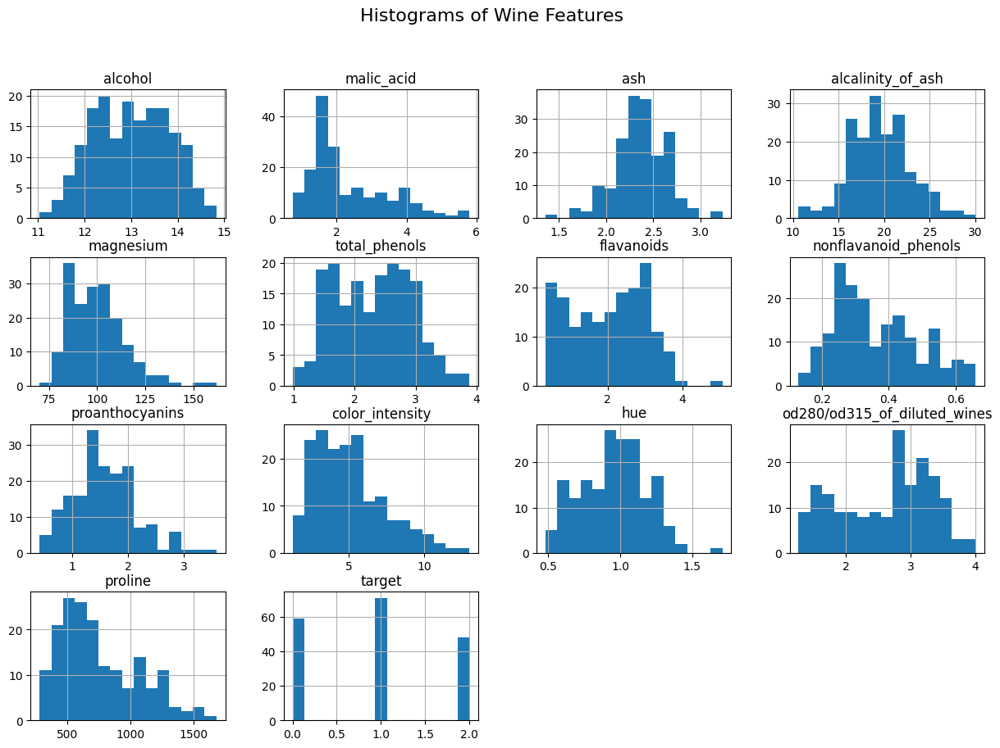

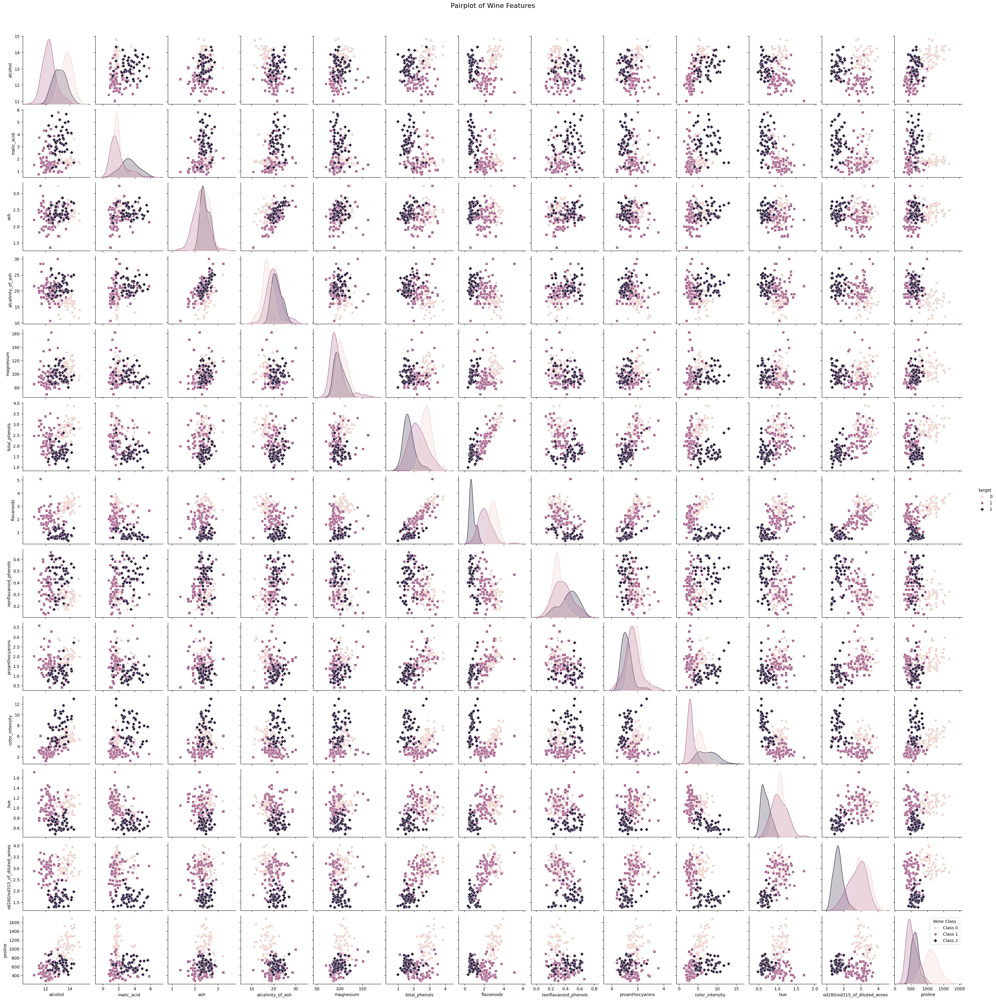

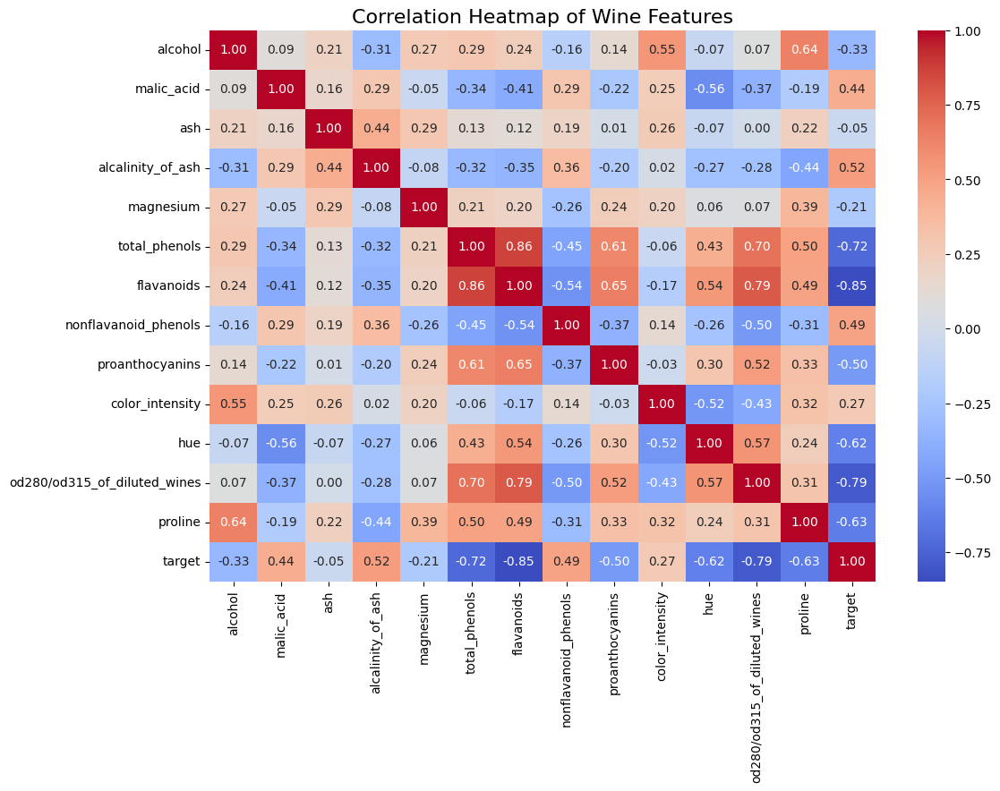

In [ ]:
import pandas as pd
from sklearn.datasets import load_wine
import matplotlib.pyplot as plt
import seaborn as sns

# Loading the Wine dataset
data = load_wine()
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = data.target

# Display summary statistics
print("Summary Statistics:")
print(df.describe())

# Plotting histograms for each feature
df.hist(bins=15, figsize=(15, 10), layout=(4, 4))
plt.suptitle("Histograms of Wine Features", fontsize=16)
plt.show()

# Plotting pairplots to visualize relationships between features
pairplot = sns.pairplot(df, hue='target', diag_kind='kde', markers=["o", "s", "D"])
pairplot.fig.suptitle("Pairplot of Wine Features", y=1.02, fontsize=16)

# Adding a custom legend
handles = pairplot._legend_data.values()
labels = ['Class 0', 'Class 1', 'Class 2']
plt.legend(handles=handles, labels=labels, title='Wine Class', loc='upper right')
plt.show()

# Correlation matrix and heatmap
corr = df.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap of Wine Features", fontsize=16)
plt.show()


For the Wine dataset, preprocessing ensures that the data is consistent, relevant, and ready for the model.
 Features in the Wine dataset are measured in different units and scales.
 Also, Some features may be irrelevant or redundant. Removing these features can improve model performance by reducing overfitting and simplifying the model.


Summary Statistics (Before Standardization):
          alcohol  malic_acid         ash  alcalinity_of_ash   magnesium  \
count  178.000000  178.000000  178.000000         178.000000  178.000000   
mean    13.000618    2.336348    2.366517          19.494944   99.741573   
std      0.811827    1.117146    0.274344           3.339564   14.282484   
min     11.030000    0.740000    1.360000          10.600000   70.000000   
25%     12.362500    1.602500    2.210000          17.200000   88.000000   
50%     13.050000    1.865000    2.360000          19.500000   98.000000   
75%     13.677500    3.082500    2.557500          21.500000  107.000000   
max     14.830000    5.800000    3.230000          30.000000  162.000000   

       total_phenols  flavanoids  nonflavanoid_phenols  proanthocyanins  \
count     178.000000  178.000000            178.000000       178.000000   
mean        2.295112    2.029270              0.361854         1.590899   
std         0.625851    0.998859             

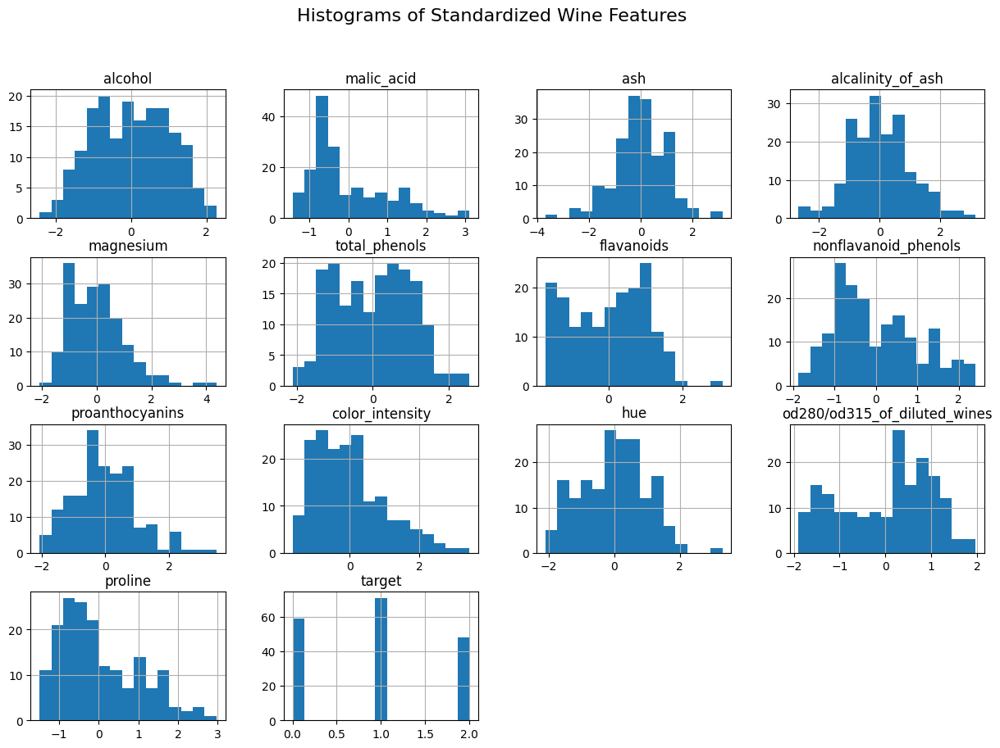

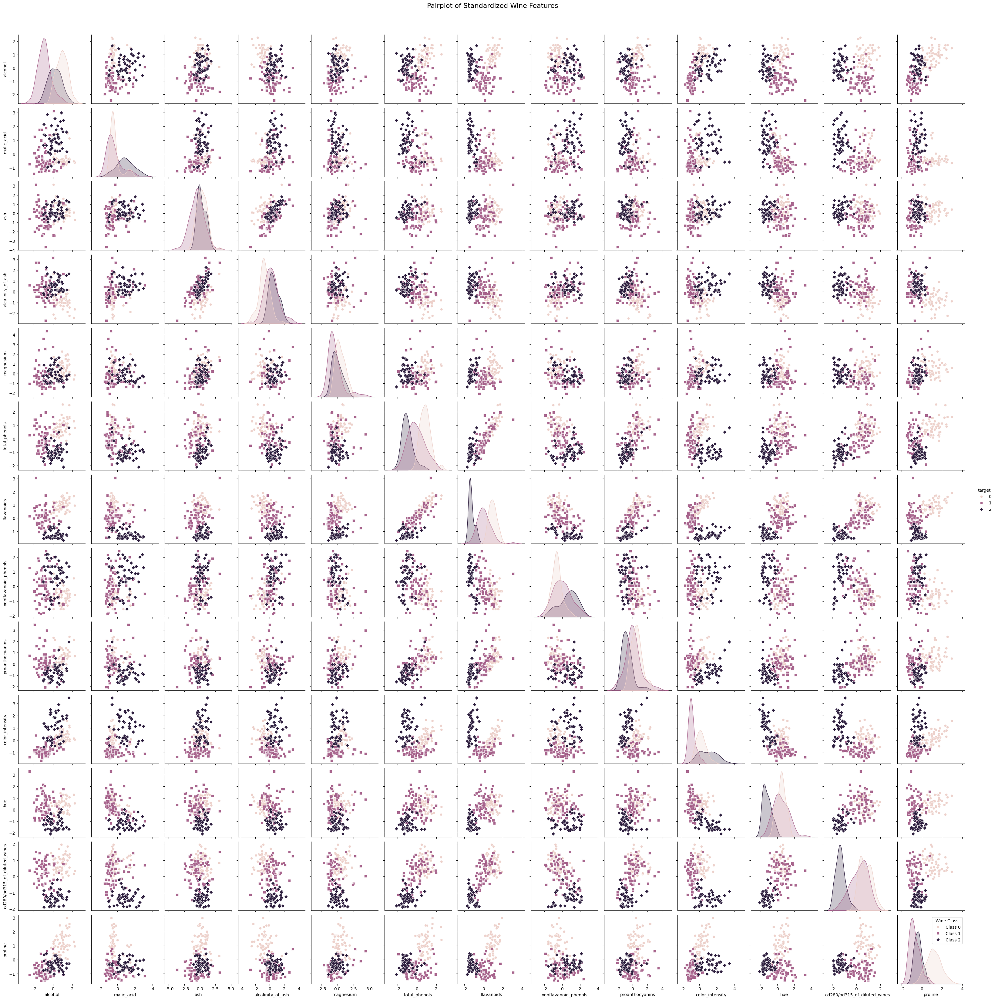

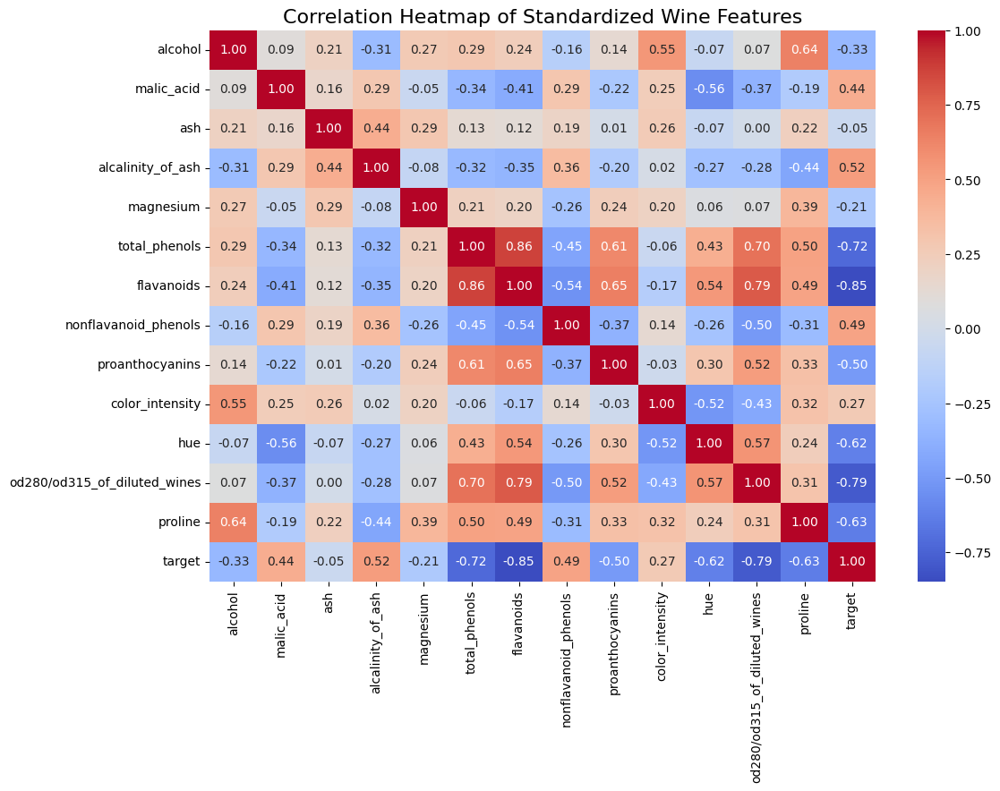

In [ ]:
import pandas as pd
from sklearn.datasets import load_wine
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Loading the Wine dataset
data = load_wine()
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = data.target

# Display summary statistics before standardization
print("Summary Statistics (Before Standardization):")
print(df.describe())

# Standardize the features
scaler = StandardScaler()
df_standardized = df.copy()
df_standardized[data.feature_names] = scaler.fit_transform(df[data.feature_names])

# Display summary statistics after standardization
print("\nSummary Statistics (After Standardization):")
print(df_standardized.describe())

# Plotting histograms for each feature (after standardization)
df_standardized.hist(bins=15, figsize=(15, 10), layout=(4, 4))
plt.suptitle("Histograms of Standardized Wine Features", fontsize=16)
plt.show()

# Plotting pairplots to visualize relationships between features (after standardization)
pairplot = sns.pairplot(df_standardized, hue='target', diag_kind='kde', markers=["o", "s", "D"])
pairplot.fig.suptitle("Pairplot of Standardized Wine Features", y=1.02, fontsize=16)

# Adding a custom legend
handles = pairplot._legend_data.values()
labels = ['Class 0', 'Class 1', 'Class 2']
plt.legend(handles=handles, labels=labels, title='Wine Class', loc='upper right')
plt.show()

# Correlation matrix and heatmap (after standardization)
corr = df_standardized.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap of Standardized Wine Features", fontsize=16)
plt.show()


Principal Component Analysis (PCA) is a dimensionality reduction technique used to transform a dataset with many features (variables) into a new dataset with fewer features while retaining most of the original variability (information)

PCA reduces the number of features in the dataset, making it easier to visualize and analyze while minimizing the loss of information.


PCA identifies new axes (principal components) that maximize the variance in the data.
These new axes are linear combinations of the original features.
The first principal component captures the most variance, the second captures the next most, and so on.

Each principal component has an associated explained variance, which indicates how much of the total variability in the data is captured by that component.
The sum of the explained variances of all principal components equals the total variance of the original dataset.

The principal components are orthogonal to each other, meaning they are uncorrelated.


**Noise Reduction**: By focusing on the components with the most variance, PCA can help reduce noise in the data.

**Visualization**: PCA can reduce the dataset to two or three dimensions, making it possible to visualize complex datasets.

**Computational Efficiency**: Reducing the number of features can lead to faster and more efficient machine learning algorithms.



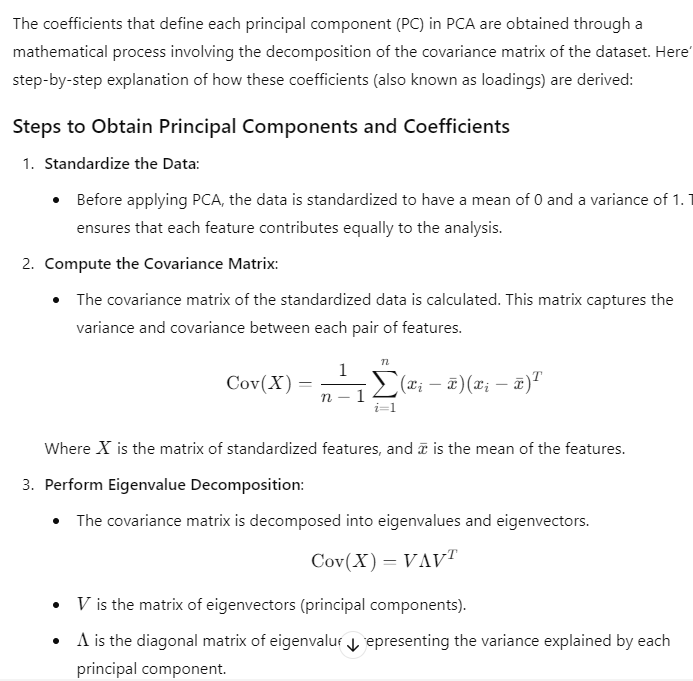


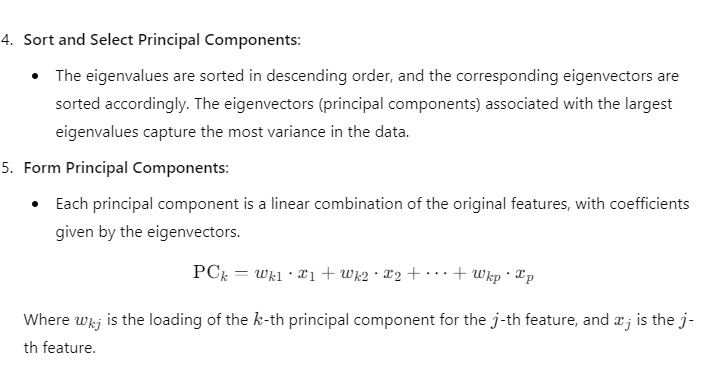

In [ ]:
import pandas as pd
from sklearn.datasets import load_wine
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Load the Wine dataset
data = load_wine()
df = pd.DataFrame(data.data, columns=data.feature_names)

# Standardize the features
scaler = StandardScaler()
df_standardized = df.copy()
df_standardized[data.feature_names] = scaler.fit_transform(df[data.feature_names])

# Apply PCA
pca = PCA()
pca.fit(df_standardized[data.feature_names])

# Extract principal components (loadings)
components_df = pd.DataFrame(pca.components_, columns=data.feature_names, index=[f"PC{i+1}" for i in range(pca.n_components_)])

# Display the principal components
print("Principal Components (Loadings):")
print(components_df)


Principal Components (Loadings):
       alcohol  malic_acid       ash  alcalinity_of_ash  magnesium  \
PC1   0.144329   -0.245188 -0.002051          -0.239320   0.141992   
PC2  -0.483652   -0.224931 -0.316069           0.010591  -0.299634   
PC3  -0.207383    0.089013  0.626224           0.612080   0.130757   
PC4  -0.017856    0.536890 -0.214176           0.060859  -0.351797   
PC5  -0.265664    0.035214 -0.143025           0.066103   0.727049   
PC6  -0.213539   -0.536814 -0.154475           0.100825  -0.038144   
PC7  -0.056396    0.420524 -0.149171          -0.286969   0.322883   
PC8  -0.396139   -0.065827  0.170260          -0.427970   0.156361   
PC9   0.508619   -0.075283 -0.307694           0.200449   0.271403   
PC10  0.211605   -0.309080 -0.027125           0.052799   0.067870   
PC11 -0.225917    0.076486 -0.498691           0.479314   0.071289   
PC12 -0.266286    0.121696 -0.049622          -0.055743   0.062220   
PC13  0.014970    0.025964 -0.141218           0.091683  

In [ ]:
import pandas as pd
from sklearn.datasets import load_wine
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Load the Wine dataset
data = load_wine()
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = data.target

# Standardize the features
scaler = StandardScaler()
df_standardized = df.copy()
df_standardized[data.feature_names] = scaler.fit_transform(df[data.feature_names])

# Apply PCA
pca = PCA()
pca.fit(df_standardized[data.feature_names])

# Extract principal components (loadings)
components_df = pd.DataFrame(pca.components_, columns=data.feature_names, index=[f"PC{i+1}" for i in range(pca.n_components_)])

# Display principal components as linear combinations
print("Principal Components as Linear Combinations:")
for i, component in components_df.iterrows():
    linear_combination = " + ".join([f"{coef:.4f} * {feature}" for feature, coef in component.items()])
    print(f"{i}: {linear_combination}")


Principal Components as Linear Combinations:
PC1: 0.1443 * alcohol + -0.2452 * malic_acid + -0.0021 * ash + -0.2393 * alcalinity_of_ash + 0.1420 * magnesium + 0.3947 * total_phenols + 0.4229 * flavanoids + -0.2985 * nonflavanoid_phenols + 0.3134 * proanthocyanins + -0.0886 * color_intensity + 0.2967 * hue + 0.3762 * od280/od315_of_diluted_wines + 0.2868 * proline
PC2: -0.4837 * alcohol + -0.2249 * malic_acid + -0.3161 * ash + 0.0106 * alcalinity_of_ash + -0.2996 * magnesium + -0.0650 * total_phenols + 0.0034 * flavanoids + -0.0288 * nonflavanoid_phenols + -0.0393 * proanthocyanins + -0.5300 * color_intensity + 0.2792 * hue + 0.1645 * od280/od315_of_diluted_wines + -0.3649 * proline
PC3: -0.2074 * alcohol + 0.0890 * malic_acid + 0.6262 * ash + 0.6121 * alcalinity_of_ash + 0.1308 * magnesium + 0.1462 * total_phenols + 0.1507 * flavanoids + 0.1704 * nonflavanoid_phenols + 0.1495 * proanthocyanins + -0.1373 * color_intensity + 0.0852 * hue + 0.1660 * od280/od315_of_diluted_wines + -0.1267 

The explained variance ratio by principal components represents the proportion of the dataset's total variance that each principal component accounts for. This ratio indicates how much information (variance) is captured by each component. the variance ratio for each principal component (PC) was provided as follows:


PC1 explains 36.20% of the total variance in the dataset, making it the most significant component in terms of information capture.
PC2 captures an additional 19.21% of the variance.
PC3 captures 11.12%, and so on.
The explained variance ratio decreases with each successive principal component, as the components are ordered by the amount of variance they capture, from most to least.

Explained Variance Ratio by Principal Component:
Principal Component 1: 0.3620
Principal Component 2: 0.1921
Principal Component 3: 0.1112
Principal Component 4: 0.0707
Principal Component 5: 0.0656
Principal Component 6: 0.0494
Principal Component 7: 0.0424
Principal Component 8: 0.0268
Principal Component 9: 0.0222
Principal Component 10: 0.0193
Principal Component 11: 0.0174
Principal Component 12: 0.0130
Principal Component 13: 0.0080

Cumulative Explained Variance:
Principal Component 1: 0.3620
Principal Component 2: 0.5541
Principal Component 3: 0.6653
Principal Component 4: 0.7360
Principal Component 5: 0.8016
Principal Component 6: 0.8510
Principal Component 7: 0.8934
Principal Component 8: 0.9202
Principal Component 9: 0.9424
Principal Component 10: 0.9617
Principal Component 11: 0.9791
Principal Component 12: 0.9920
Principal Component 13: 1.0000

Number of principal components to retain 95% of the variance: 10


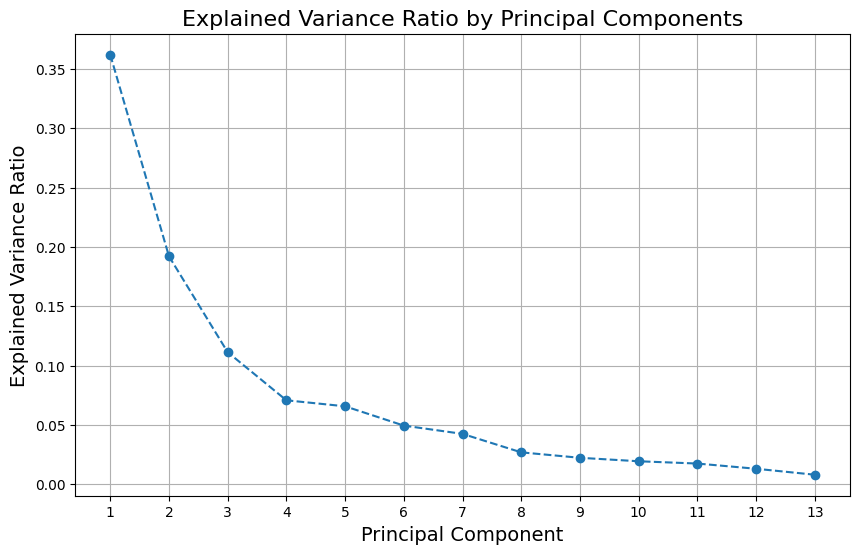

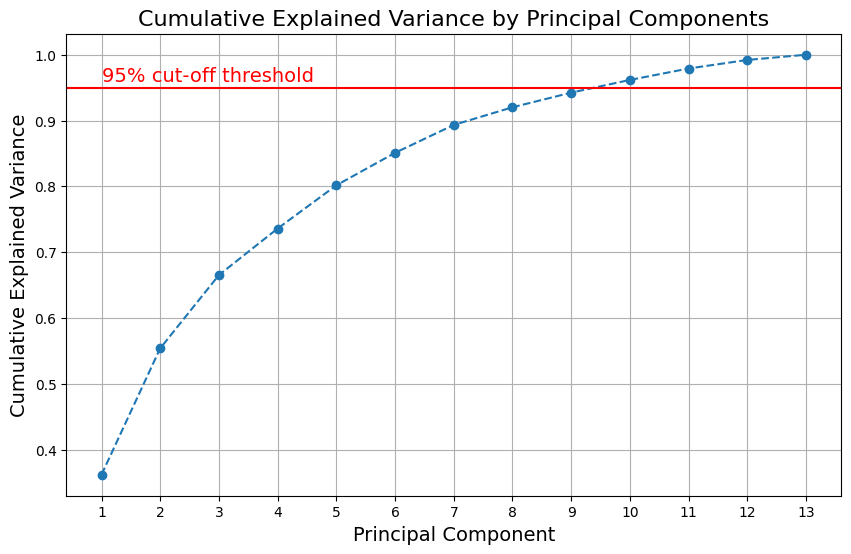

In [ ]:
import pandas as pd
from sklearn.datasets import load_wine
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Load the Wine dataset
data = load_wine()
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = data.target

# Standardize the features
scaler = StandardScaler()
df_standardized = df.copy()
df_standardized[data.feature_names] = scaler.fit_transform(df[data.feature_names])

# Apply PCA
pca = PCA()
pca.fit(df_standardized[data.feature_names])

# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = explained_variance_ratio.cumsum()

# Display the explained variance of each principal component
print("Explained Variance Ratio by Principal Component:")
for i, var_ratio in enumerate(explained_variance_ratio, start=1):
    print(f"Principal Component {i}: {var_ratio:.4f}")

print("\nCumulative Explained Variance:")
for i, cum_var in enumerate(cumulative_explained_variance, start=1):
    print(f"Principal Component {i}: {cum_var:.4f}")

# Determine the number of components to keep based on the 95% explained variance threshold
n_components = next(i for i, total in enumerate(cumulative_explained_variance) if total >= 0.95) + 1
print(f"\nNumber of principal components to retain 95% of the variance: {n_components}")

# Plotting the explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='--')
plt.title('Explained Variance Ratio by Principal Components', fontsize=16)
plt.xlabel('Principal Component', fontsize=14)
plt.ylabel('Explained Variance Ratio', fontsize=14)
plt.xticks(range(1, len(explained_variance_ratio) + 1))
plt.grid()
plt.show()

# Plotting the cumulative explained variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o', linestyle='--')
plt.title('Cumulative Explained Variance by Principal Components', fontsize=16)
plt.xlabel('Principal Component', fontsize=14)
plt.ylabel('Cumulative Explained Variance', fontsize=14)
plt.xticks(range(1, len(cumulative_explained_variance) + 1))
plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(1, 0.96, '95% cut-off threshold', color='red', fontsize=14)
plt.grid()
plt.show()


In [ ]:
import pandas as pd
from sklearn.datasets import load_wine
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.graph_objects as go

# Loading the Wine dataset
data = load_wine()
df = pd.DataFrame(data.data, columns=data.feature_names)

# Standardize the features
scaler = StandardScaler()
df_standardized = scaler.fit_transform(df[data.feature_names])

# Apply PCA and keep all components
pca = PCA(n_components=10)  # Number of components to retain
principal_components = pca.fit_transform(df_standardized)

# Create a DataFrame with the principal components
pc_df = pd.DataFrame(principal_components, columns=[f'PC{i+1}' for i in range(10)])

# Displaying the principal components in an interactive table
fig = go.Figure(data=[go.Table(
    header=dict(values=list(pc_df.columns),
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[pc_df[col] for col in pc_df.columns],
               fill_color='lavender',
               align='left'))
])

fig.show()


Summary Statistics of Principal Components:
              PC1           PC2           PC3           PC4           PC5  \
count  178.000000  1.780000e+02  1.780000e+02  1.780000e+02  1.780000e+02   
mean     0.000000  6.985673e-17  2.993860e-17 -1.995907e-17 -8.981580e-17   
std      2.175417  1.584639e+00  1.205920e+00  9.613355e-01  9.263092e-01   
min     -4.280639 -3.515090e+00 -4.585064e+00 -2.890120e+00 -2.023127e+00   
25%     -2.172762 -1.233675e+00 -8.311875e-01 -6.860538e-01 -5.734337e-01   
50%      0.060511 -2.620302e-01 -1.416121e-01 -2.579312e-02 -2.658996e-01   
75%      2.001293  1.398300e+00  7.600610e-01  5.871144e-01  3.550493e-01   
max      4.312784  3.871784e+00  5.345388e+00  3.790335e+00  4.186657e+00   

                PC6           PC7         PC8           PC9          PC10  
count  1.780000e+02  1.780000e+02  178.000000  1.780000e+02  1.780000e+02  
mean  -1.796316e-16 -5.176883e-17    0.000000  1.621674e-16 -2.894065e-16  
std    8.032946e-01  7.444068e-01 

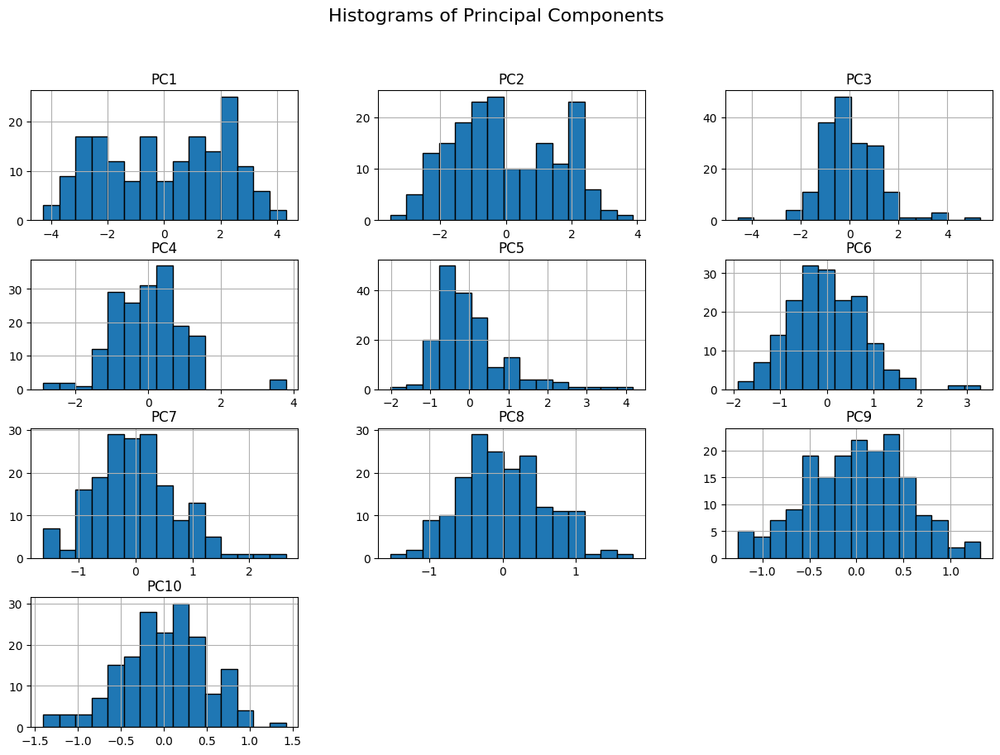

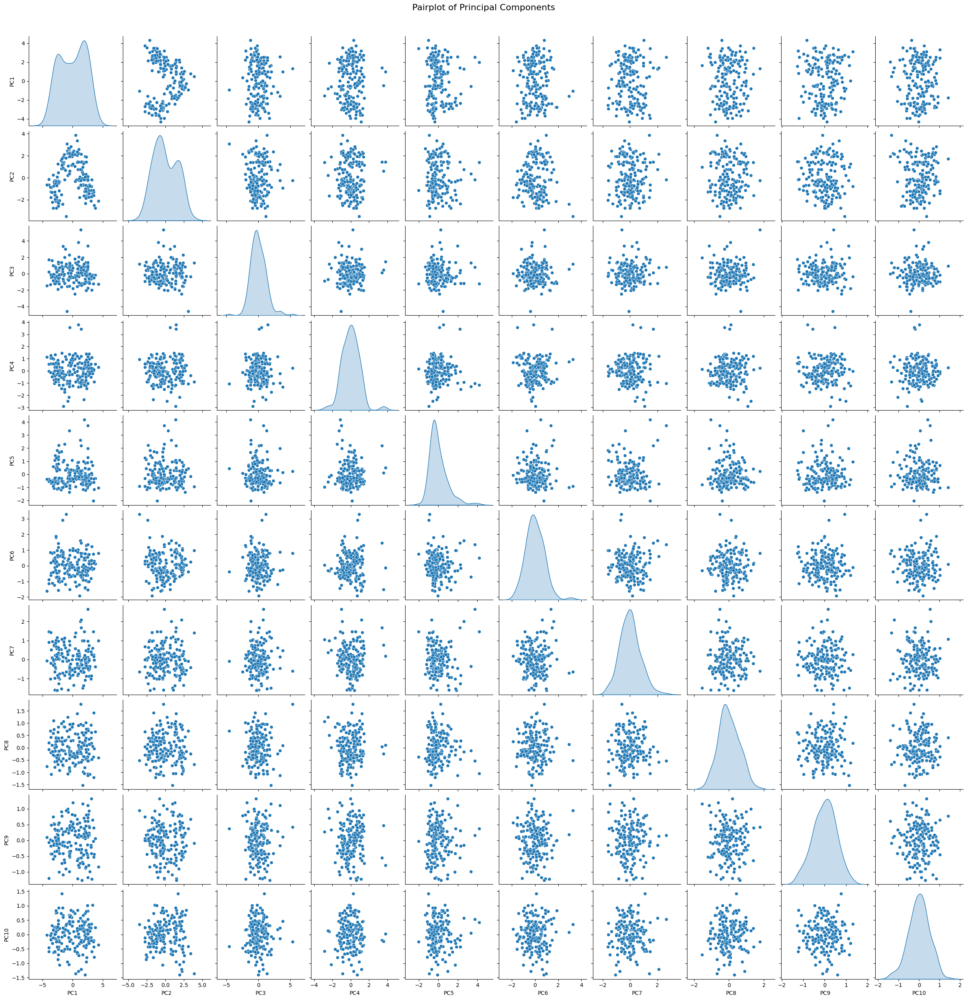

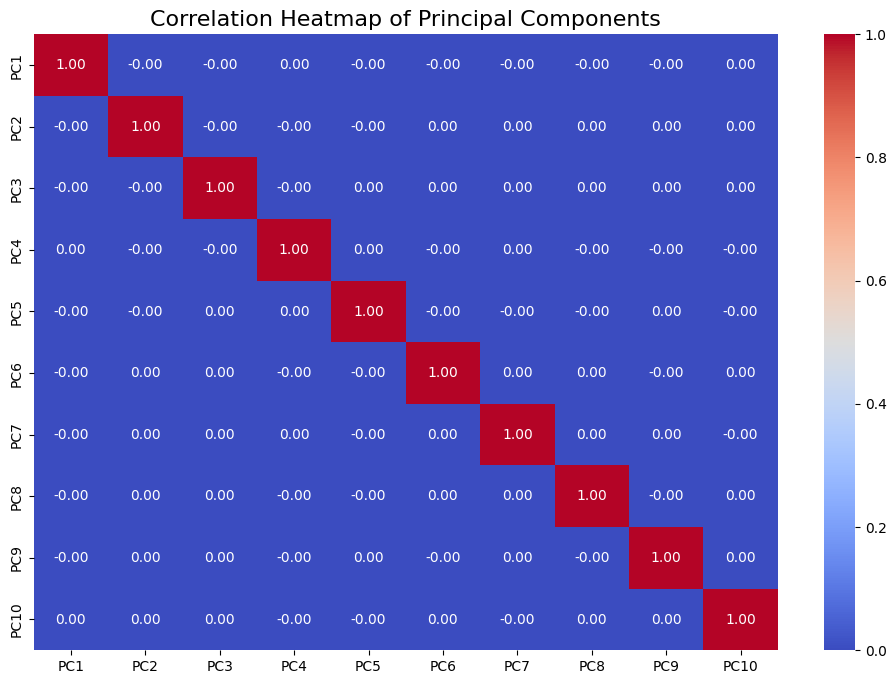

In [ ]:
import pandas as pd
from sklearn.datasets import load_wine
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Loading the Wine dataset
data = load_wine()
df = pd.DataFrame(data.data, columns=data.feature_names)

# Standardize the features
scaler = StandardScaler()
df_standardized = scaler.fit_transform(df[data.feature_names])

# Apply PCA and keep 10 components
pca = PCA(n_components=10)
principal_components = pca.fit_transform(df_standardized)

# Create a DataFrame with the principal components
pc_df = pd.DataFrame(principal_components, columns=[f'PC{i+1}' for i in range(10)])

# Display summary statistics for the principal components
print("Summary Statistics of Principal Components:")
print(pc_df.describe())

# Plotting histograms for each principal component
pc_df.hist(bins=15, figsize=(15, 10), layout=(4, 3), edgecolor='black')
plt.suptitle("Histograms of Principal Components", fontsize=16)
plt.show()

# Plotting pairplots to visualize relationships between principal components
pairplot = sns.pairplot(pc_df, diag_kind='kde')
pairplot.fig.suptitle("Pairplot of Principal Components", y=1.02, fontsize=16)
plt.show()

# Correlation matrix and heatmap for principal components
corr_pc = pc_df.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(corr_pc, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap of Principal Components", fontsize=16)
plt.show()


Summary Statistics of Principal Components:
              PC1           PC2           PC3           PC4           PC5  \
count  178.000000  1.780000e+02  1.780000e+02  1.780000e+02  1.780000e+02   
mean     0.000000  6.985673e-17  2.993860e-17 -1.995907e-17 -8.981580e-17   
std      2.175417  1.584639e+00  1.205920e+00  9.613355e-01  9.263092e-01   
min     -4.280639 -3.515090e+00 -4.585064e+00 -2.890120e+00 -2.023127e+00   
25%     -2.172762 -1.233675e+00 -8.311875e-01 -6.860538e-01 -5.734337e-01   
50%      0.060511 -2.620302e-01 -1.416121e-01 -2.579312e-02 -2.658996e-01   
75%      2.001293  1.398300e+00  7.600610e-01  5.871144e-01  3.550493e-01   
max      4.312784  3.871784e+00  5.345388e+00  3.790335e+00  4.186657e+00   

                PC6           PC7         PC8           PC9          PC10  \
count  1.780000e+02  1.780000e+02  178.000000  1.780000e+02  1.780000e+02   
mean  -1.796316e-16 -5.176883e-17    0.000000  1.621674e-16 -2.894065e-16   
std    8.032946e-01  7.444068e-

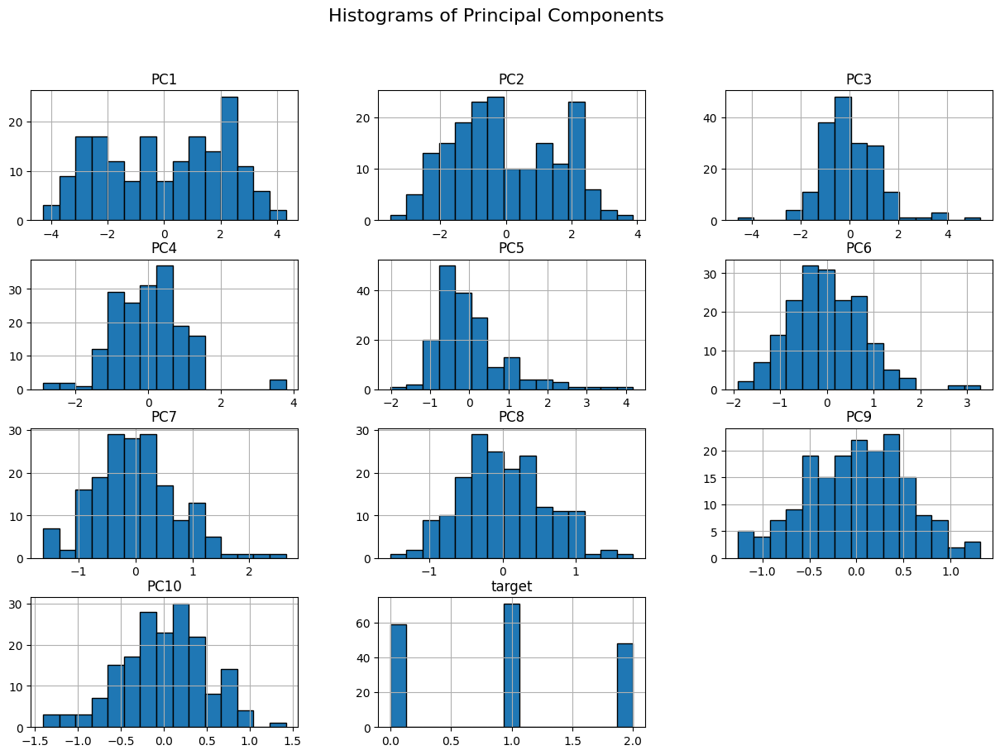

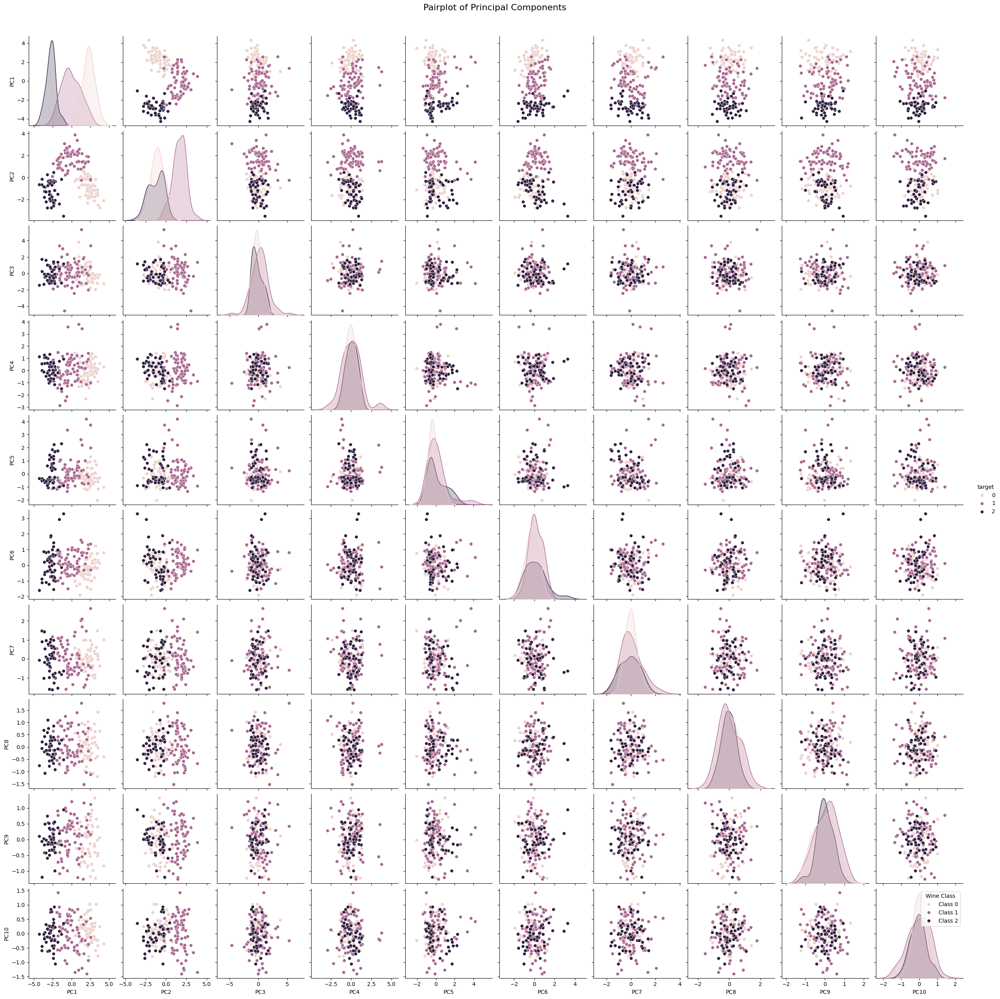

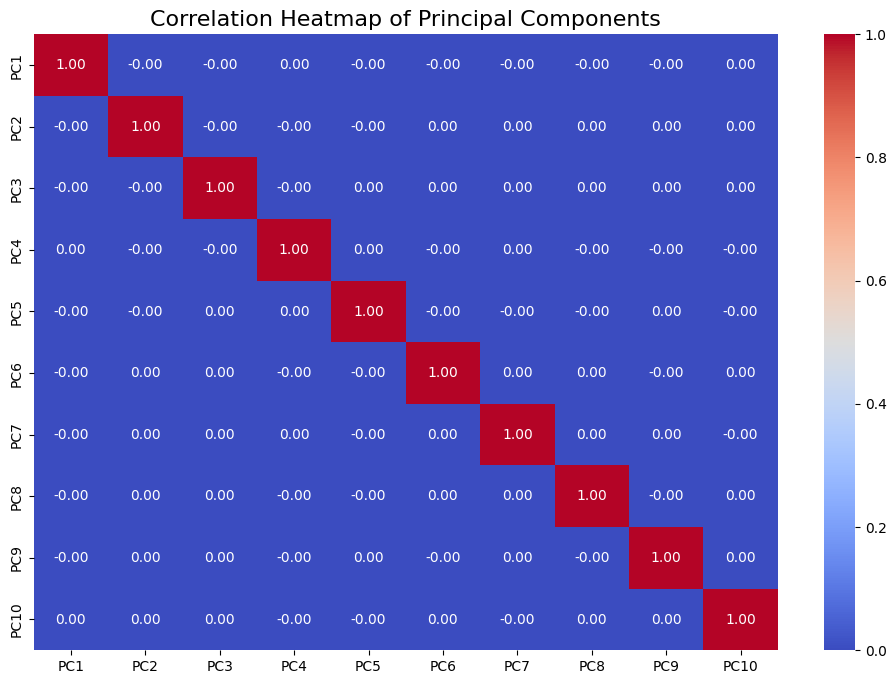

In [ ]:
import pandas as pd
from sklearn.datasets import load_wine
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Loading the Wine dataset
data = load_wine()
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = data.target

# Standardize the features
scaler = StandardScaler()
df_standardized = scaler.fit_transform(df[data.feature_names])

# Apply PCA and keep 10 components
pca = PCA(n_components=10)
principal_components = pca.fit_transform(df_standardized)

# Create a DataFrame with the principal components and target labels
pc_df = pd.DataFrame(principal_components, columns=[f'PC{i+1}' for i in range(10)])
pc_df['target'] = df['target']

# Display summary statistics for the principal components
print("Summary Statistics of Principal Components:")
print(pc_df.describe())

# Plotting histograms for each principal component
pc_df.hist(bins=15, figsize=(15, 10), layout=(4, 3), edgecolor='black')
plt.suptitle("Histograms of Principal Components", fontsize=16)
plt.show()

# Plotting pairplots to visualize relationships between principal components
pairplot = sns.pairplot(pc_df, hue='target', diag_kind='kde')
pairplot.fig.suptitle("Pairplot of Principal Components", y=1.02, fontsize=16)

# Adding a custom legend
handles = pairplot._legend_data.values()
labels = ['Class 0', 'Class 1', 'Class 2']
plt.legend(handles=handles, labels=labels, title='Wine Class', loc='upper right')
plt.show()

# Correlation matrix and heatmap for principal components
corr_pc = pc_df.drop('target', axis=1).corr()  # Remove the target column for correlation
plt.figure(figsize=(12, 8))
sns.heatmap(corr_pc, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap of Principal Components", fontsize=16)
plt.show()


#Hence the Principal components are the new variables in our new design space


In [ ]:
#intentionally blank

In [ ]:
#page blank

blank